# Multiseries Time Series Data Preparation
## November 2023
### Dr Jose M. Albornoz

In this notebook we explore the preparation of a multiseries dataset representing the sales of a department store across 24 different departments. The features in the dataset describe sales as a function of the size of each department, number of employees, percentage of merchadise on sale and on promotion, marketing events, local events that can attract crowds to the vicinity of the store, and macroeconomic indicators such as consumer price index, GDP, and percentage change in US unemployment insurance claims.

The dataset presents several challenges such as missing timestamps, missing values, and different starting and end dates for each of the series in the dataset. We will address these issues, and we, perhaps more interestingly, we will also inspect the data to identify similarities across the `Sales` series that could indicate the presence of clusters.

# Import necessary modules

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import style
from matplotlib import cm
style.use('fivethirtyeight')
%matplotlib inline
plt.rcParams.update({'figure.max_open_warning': 0})

from sklearn.compose import make_column_selector as selector

import random
import time

RANDOM_STATE = 801
pd.options.mode.chained_assignment = None

# maximum number of rdataframe ows and columns displayed
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 500)

# 1.- Load data

## 1.1.- Original dataset

In [2]:
df_0 = pd.read_excel('data/time_series_poc_certification_training.xlsx')

In [3]:
df_0.shape

(18000, 14)

In [4]:
df_0['Date'] = pd.to_datetime(df_0['Date'], format = '%Y-%m-%d')

In [5]:
# get list of departments
departments = df_0['Department'].unique().tolist()
len(departments)

24

We now plot the series corresponding to each department:

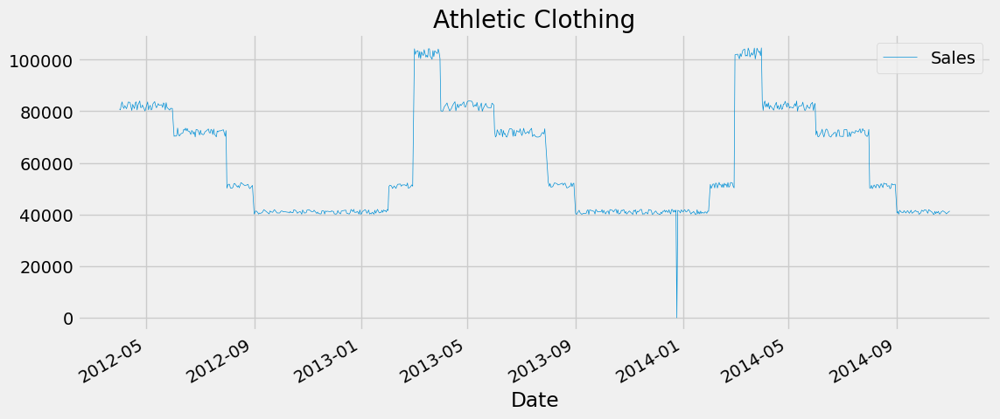

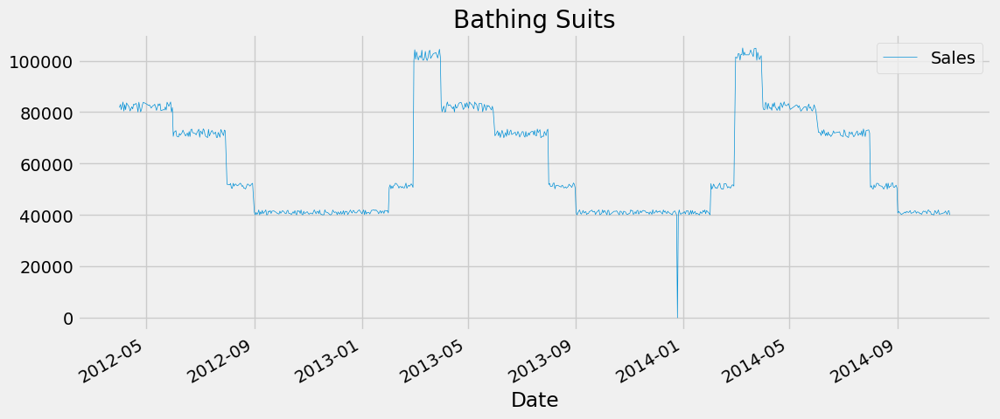

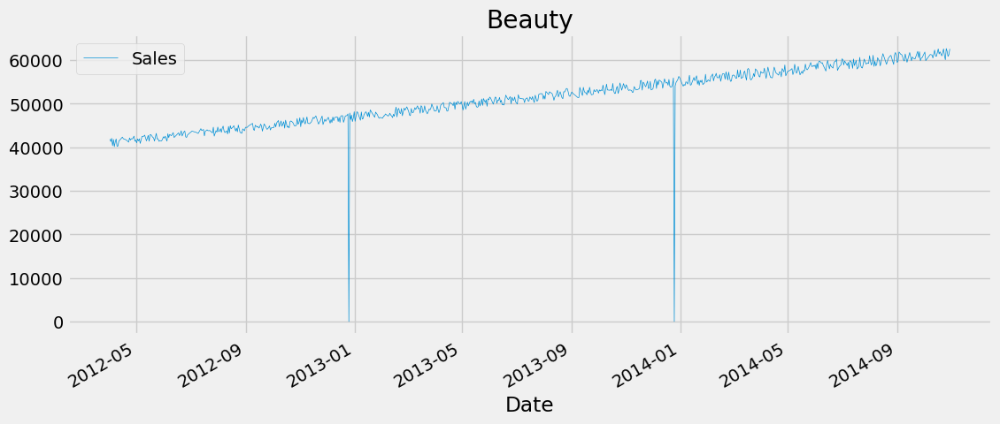

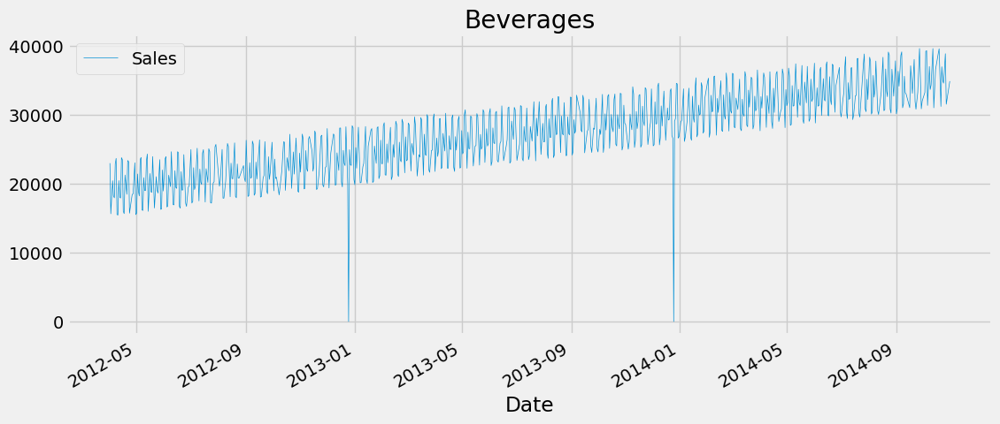

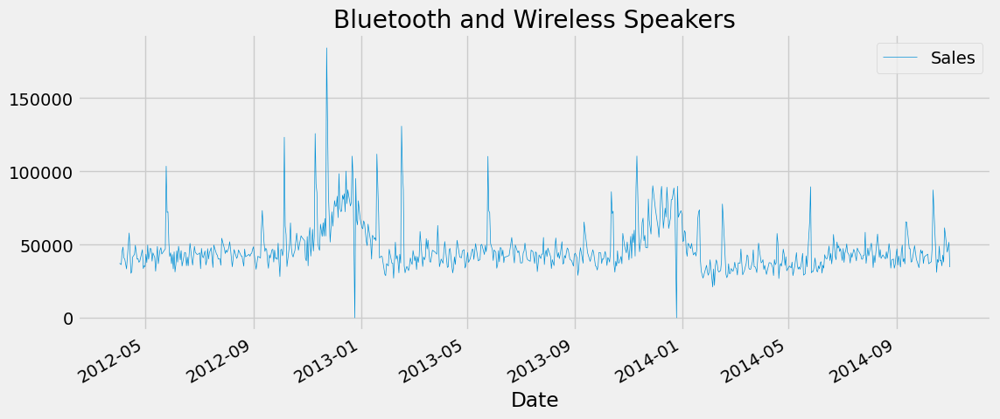

...

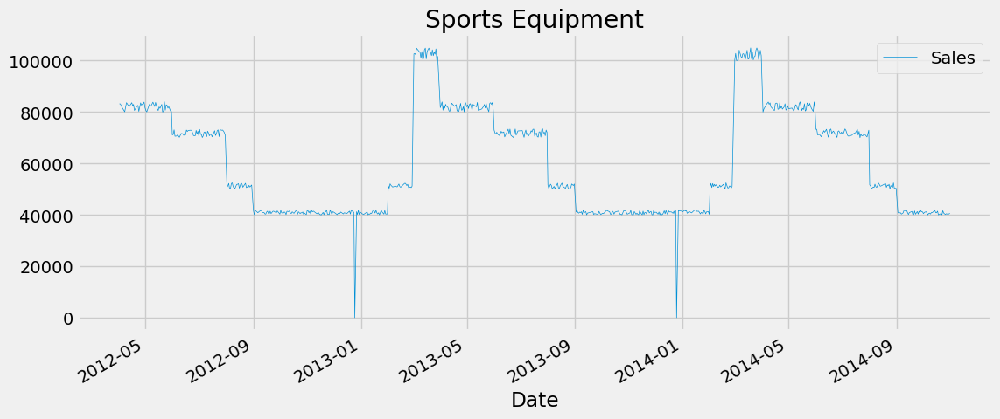

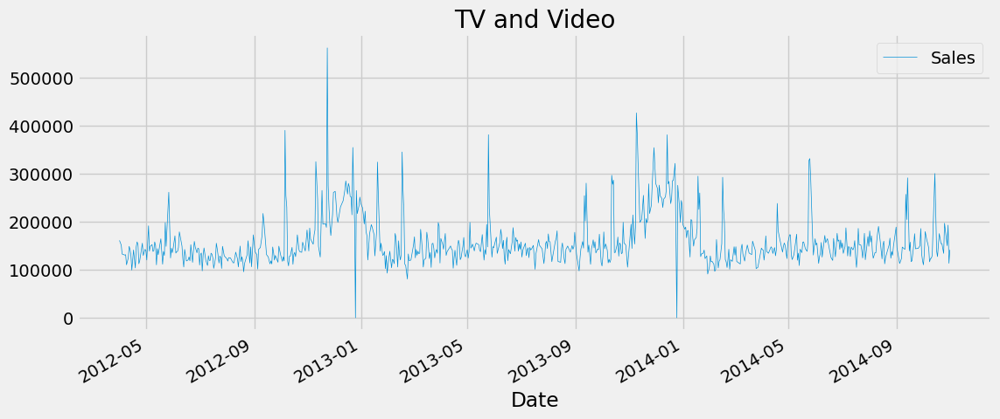

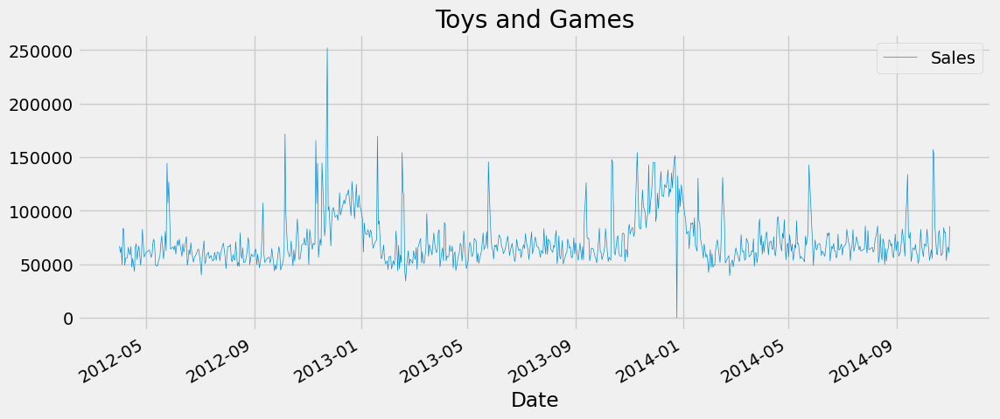

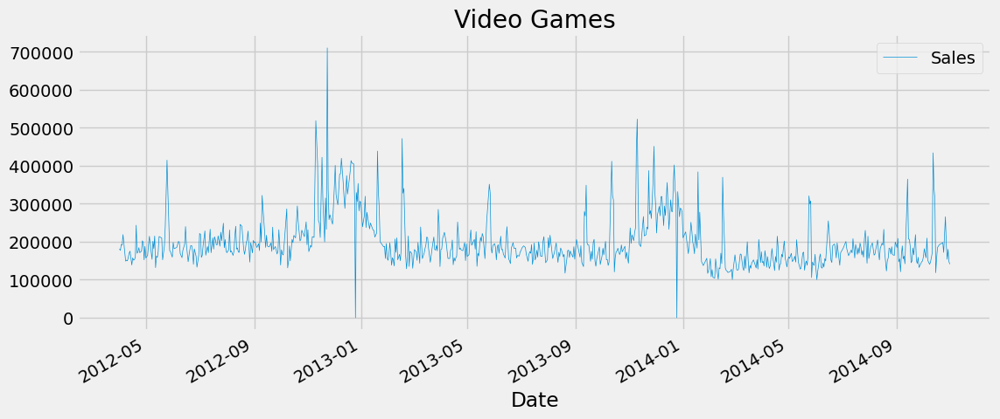

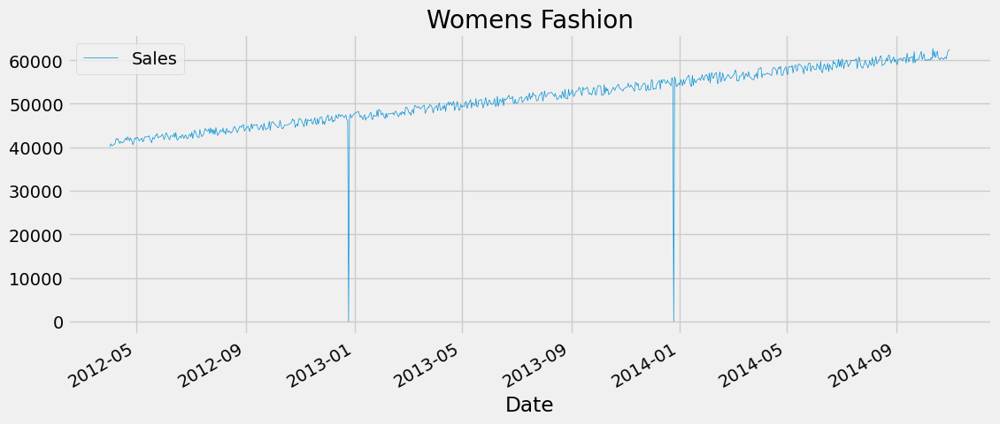

In [6]:
for k in departments:
    df_0[df_0['Department']==k].plot('Date', 'Sales', figsize=(12,5), grid=True, linewidth=0.5, title=k);

From the inspection of the above plots it can be seen that there is a high degree of similarity amongst some of the series. Three clusters can be clearly identified from the shapes of the series across the departments:

* **Cluster A**: 'Athletic Clothing', 'Bathing Suits', 'Sports Equipment', 'Lawn and Garden'
* **Cluster B**: 'Beauty', 'Beverages', 'Childrens Fashion', 'Dairy, Cheese, and Eggs', 'Fruit and Vegetables', 'Meat and Seafood', 'Mens Fashion', 'Pet Supplies', 'Snack Foods', 'Womens Fashion'
* **Cluster C**: 'Bluetooth and Wireless Speakers', 'Camera, Photo, and Video', 'Cell Phones and Accesories', 'Computer Parts and Components', 'Computers and Tablets', 'Electronics', 'Headphones', 'TV and Video', 'Toys and Games', 'Video Games'

We will now plot each series by cluster to more clearly visualise these similarities.

In [7]:
clusterA = ['Athletic Clothing', 'Bathing Suits', 'Sports Equipment', 'Lawn and Garden']
clusterB = ['Beauty', 'Beverages', 'Childrens Fashion', 'Dairy, Cheese, and Eggs', 'Fruit and Vegetables', 
            'Meat and Seafood', 'Mens Fashion', 'Pet Supplies', 'Snack Foods', 'Womens Fashion']
clusterC = ['Bluetooth and Wireless Speakers', 'Camera, Photo, and Video', 'Cell Phones and Accessories', 
            'Computer Parts and Components', 'Computers and Tablets', 'Electronics', 'Headphones', 'TV and Video', 
            'Toys and Games', 'Video Games']
clusters = [clusterA, clusterB, clusterC]

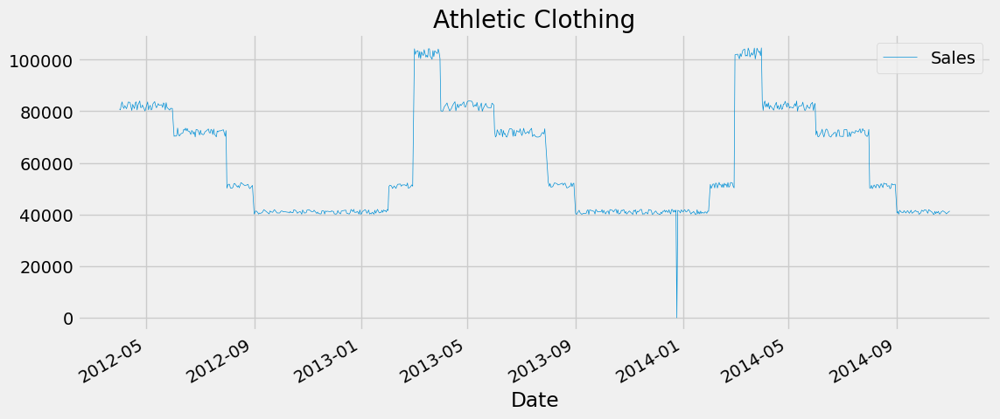

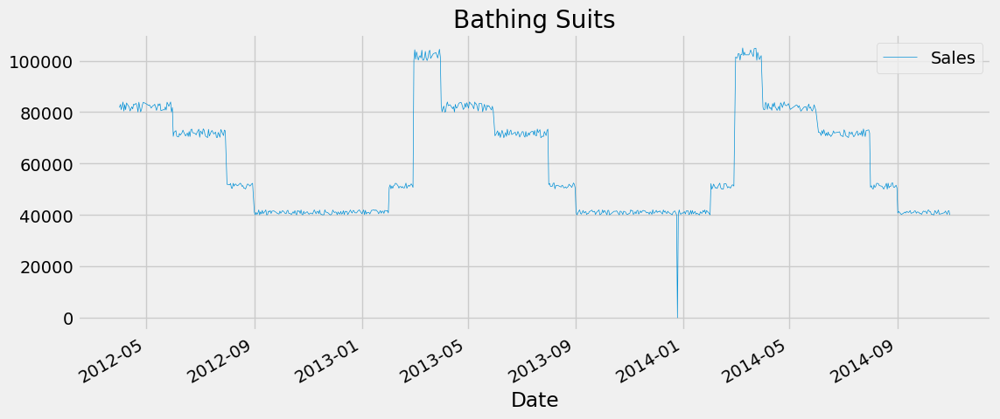

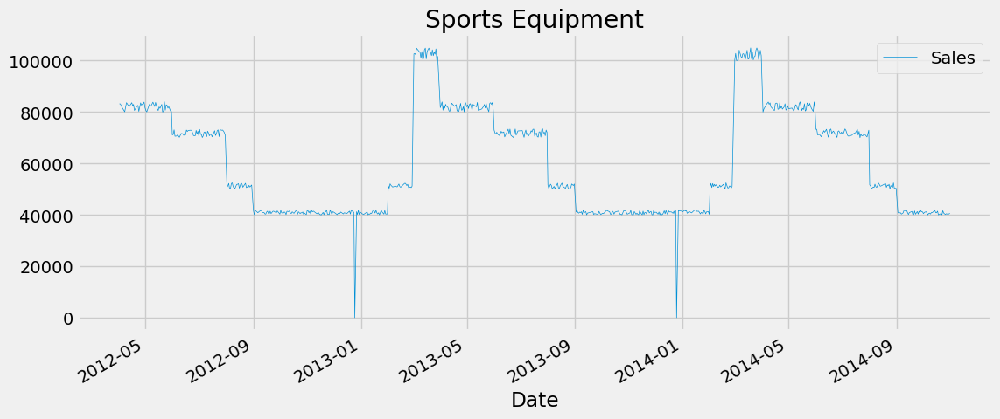

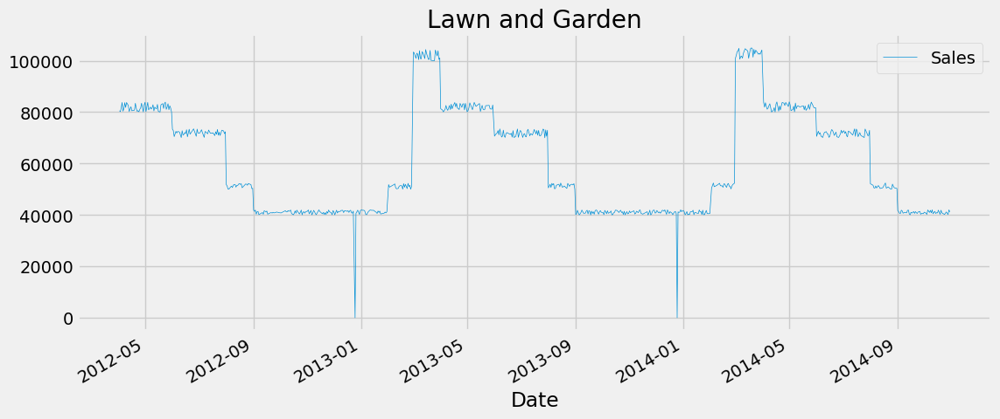

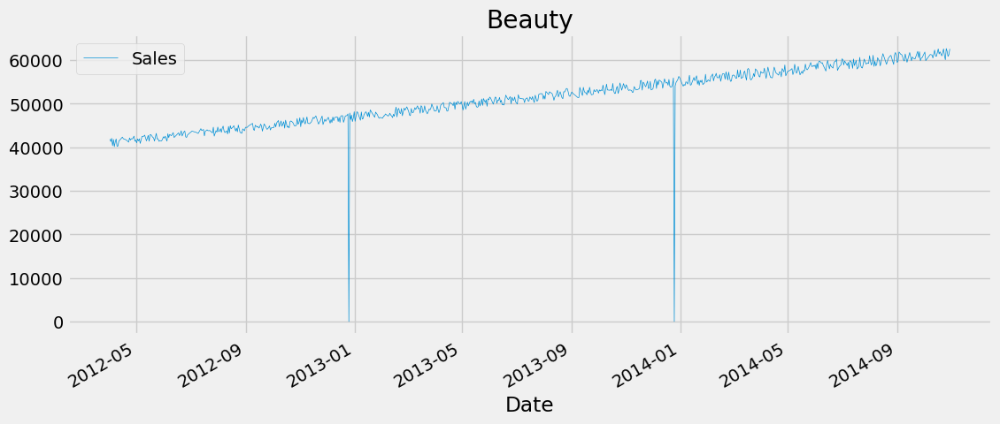

...

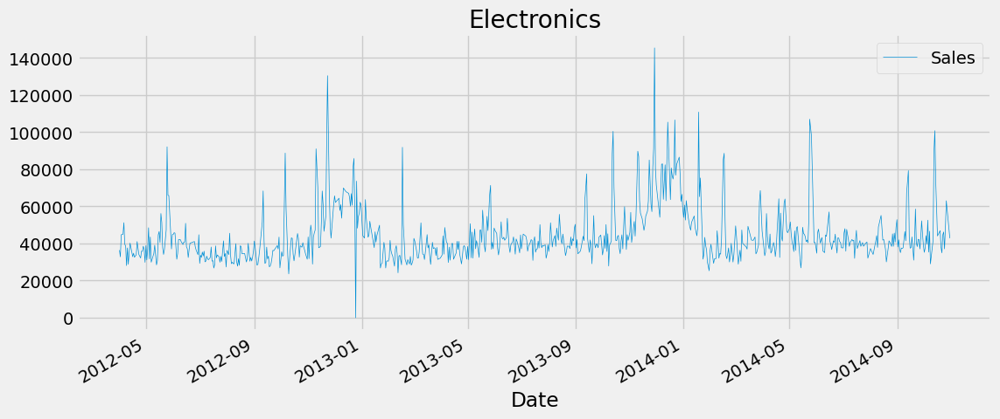

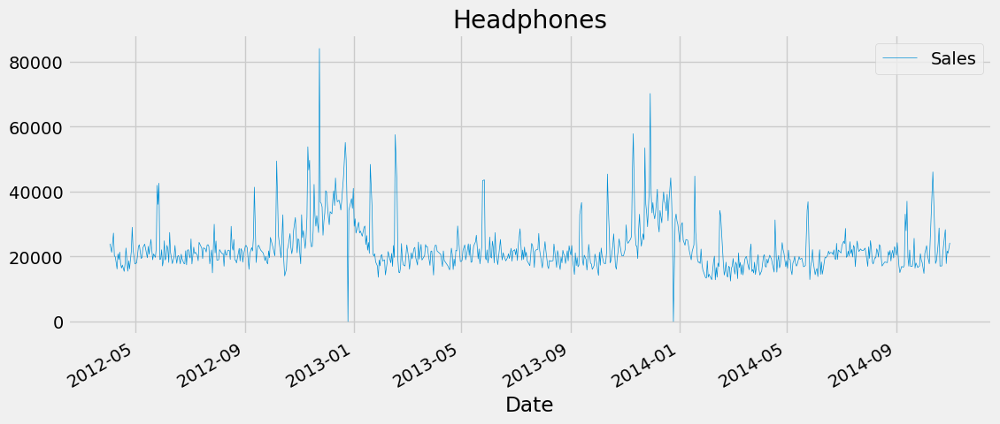

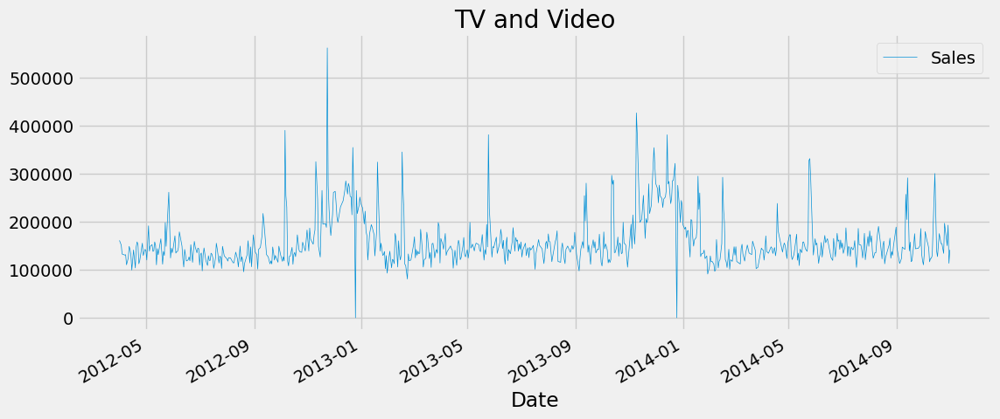

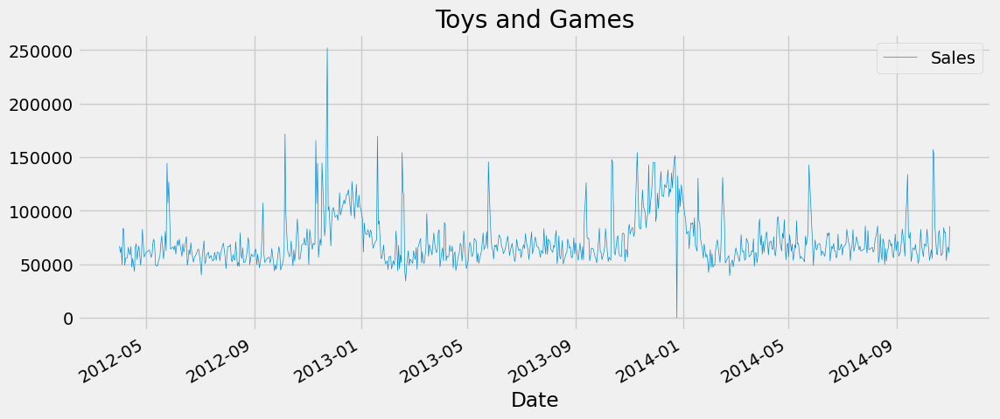

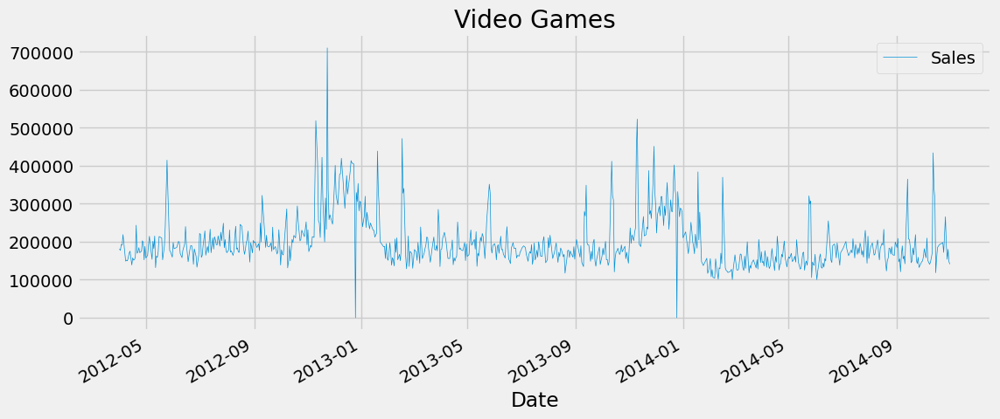

In [8]:
for j in clusters:
    for k in j:
        df_0[df_0['Department']==k].plot('Date', 'Sales', figsize=(12,5), grid=True, linewidth=0.5, title=k);    

## 1.2.- Starting and ending dates for each series

In [9]:
df_1 = df_0.copy()

In [10]:
df_1.set_index('Date', inplace=True)

In [11]:
start_dates = []
end_dates = []
for k in departments:
    df = df_1[df_1['Department']==k]
    print(f'Series for {df["Department"][0]}')
    print(f'Starting date: {df.index.min()} ; Ending date: {df.index.max()}')
    print(f'Number of rows in the series: {len(df)}')
    print('')

Series for Athletic Clothing
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 726

Series for Bathing Suits
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-30 00:00:00
Number of rows in the series: 758

Series for Beauty
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-30 00:00:00
Number of rows in the series: 740

Series for Beverages
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 752

Series for Bluetooth and Wireless Speakers
Starting date: 2012-04-02 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 755

Series for Camera, Photo, and Video
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 772

Series for Cell Phones and Accessories
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 748

Series for Childrens Fashion
Starting date: 2012-04-01

We observe that starting and ending dates are different across the series. We will compensate for this once we perform the necessary imputation on the dataset.

## 1.3.- Splitting the dataset by `Department`

The original dataset will be split into a list of 24 dataframes, each corresponding to a department

In [12]:
df_list = [d for _, d in df_1.groupby(['Department'])]

# 2.- Missing timestamps imputation

We are aware that there are missing timestamps in the dataset - these will be imputed in the following code cells.

## 2.1.- Visualising missing timestamps

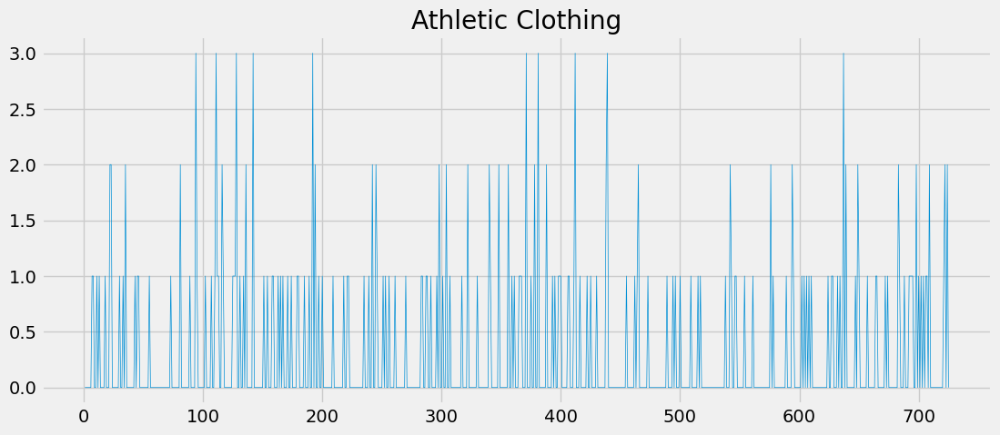

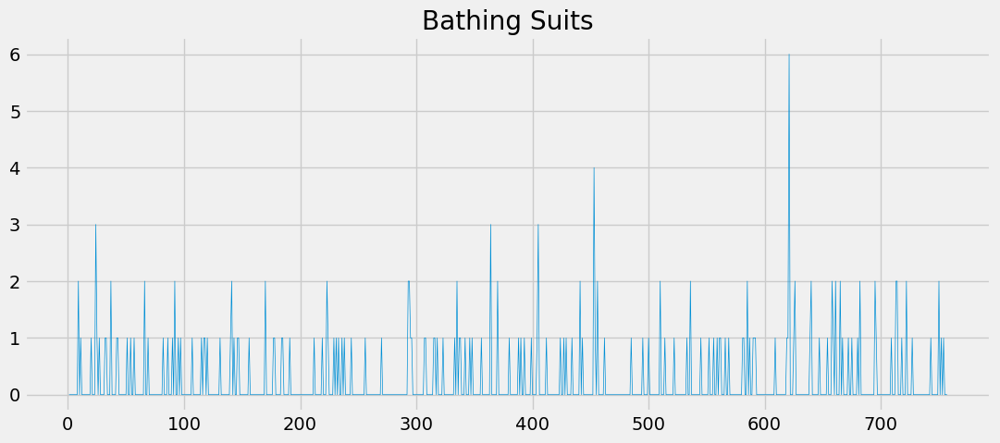

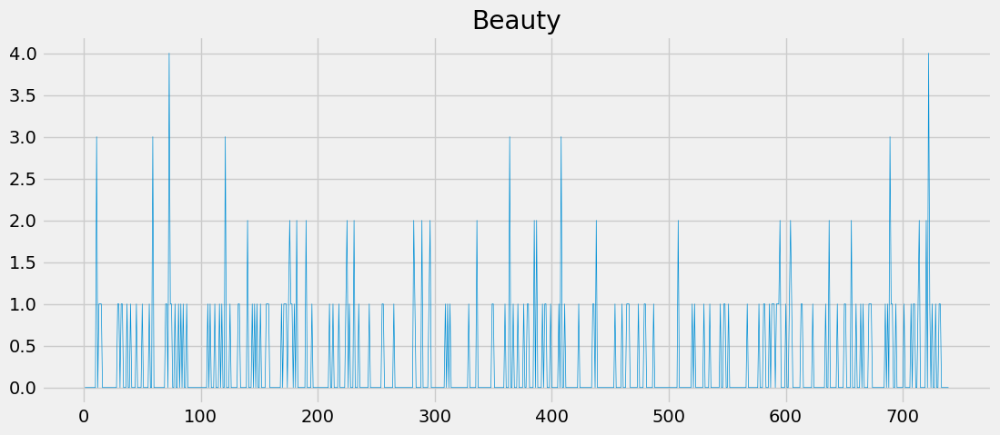

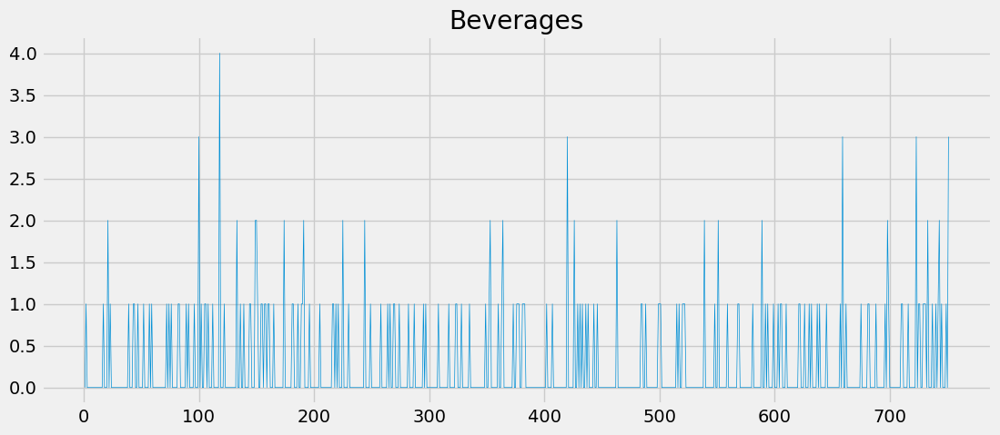

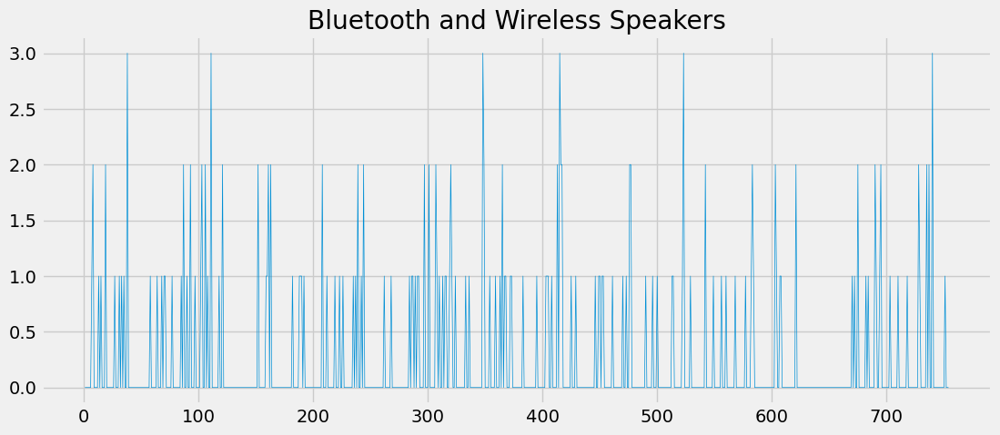

...

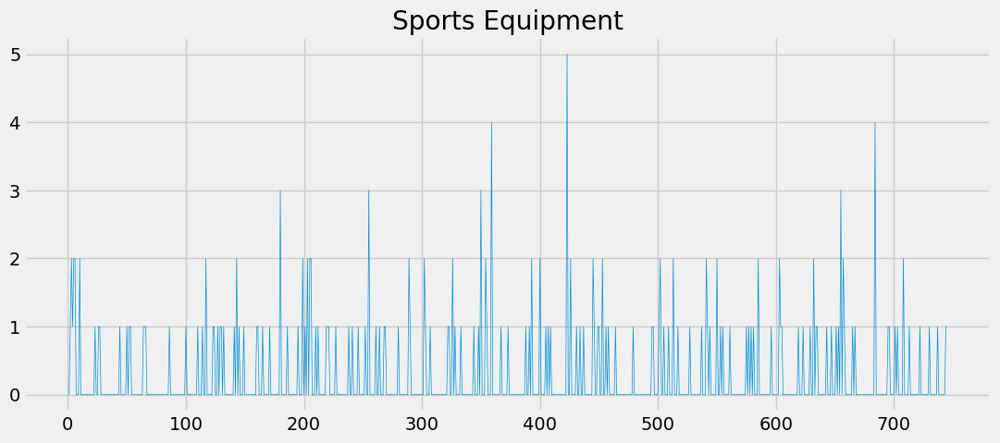

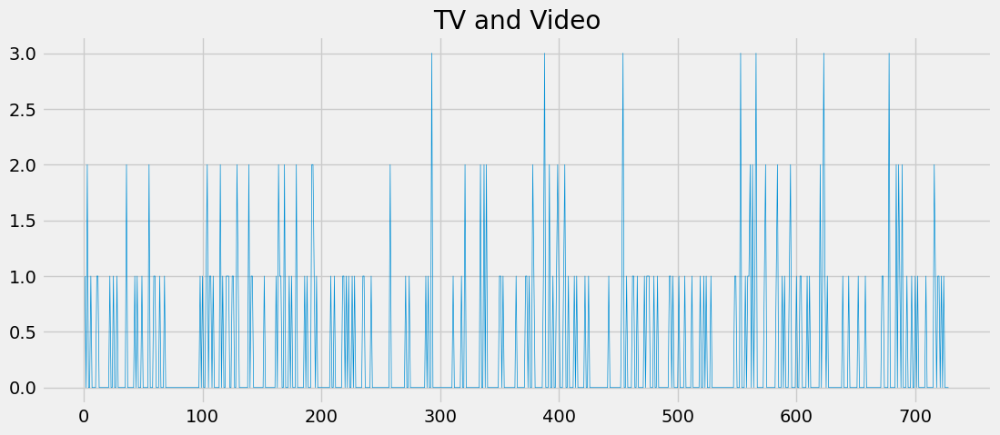

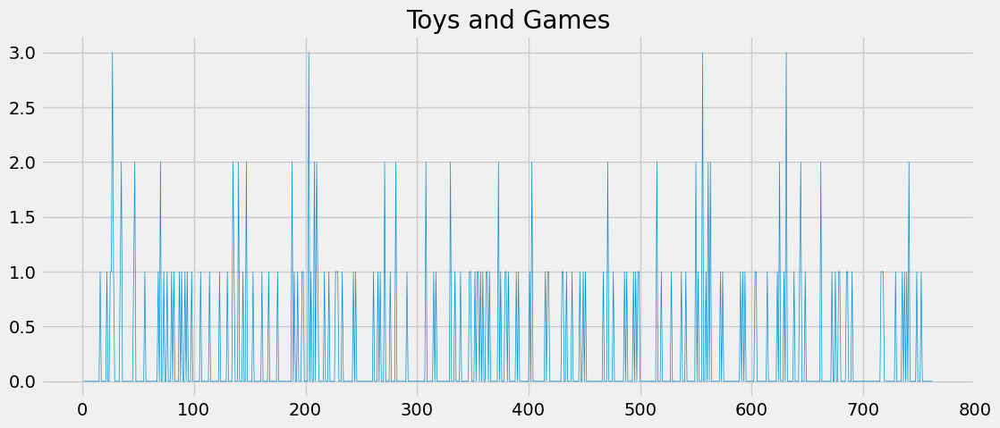

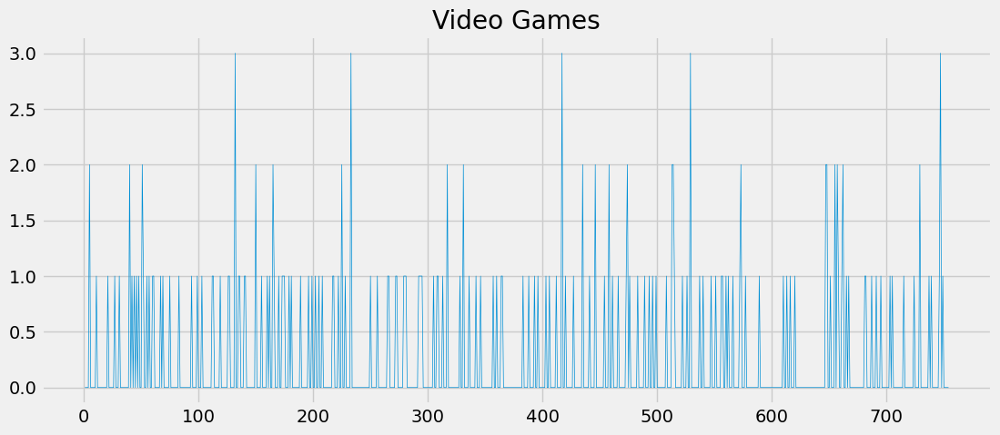

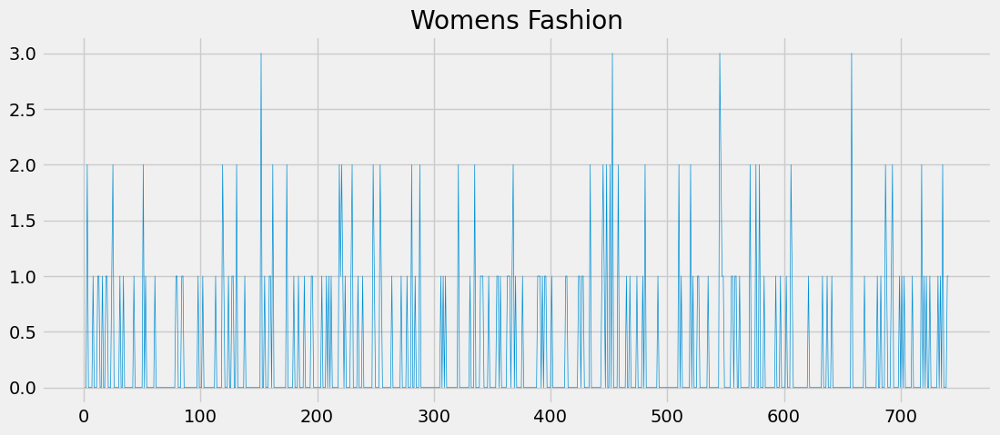

In [13]:
for df in df_list:
    timestamp_gaps = pd.Series(df.index).diff().dt.days - 1
    timestamp_gaps.plot(figsize=(12,5), grid=True, linewidth=0.5, title=df['Department'][0])
    plt.show()

We can see that the size of the gaps in the series' timestamps ranges from 1 to 6 days across the 24 departments represented in the dataset. 

## 2.2.- Imputing missing timestamps

In [14]:
df_list_imputed = []
for df in df_list:
    df = df.asfreq('D')
    df_list_imputed.append(df)

Let's verify that there are no more missing timestamps.

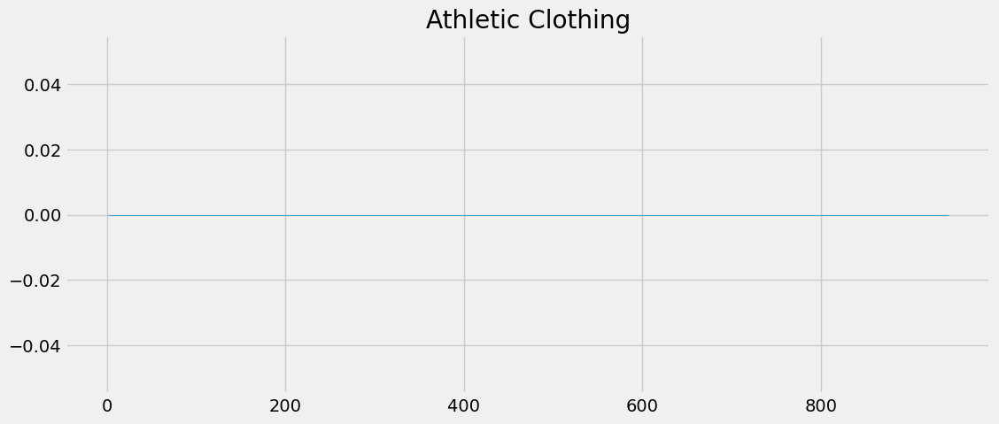

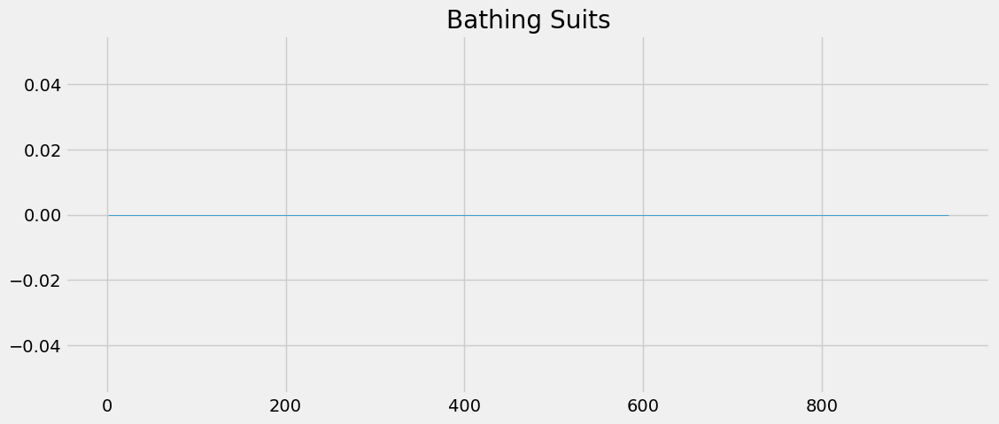

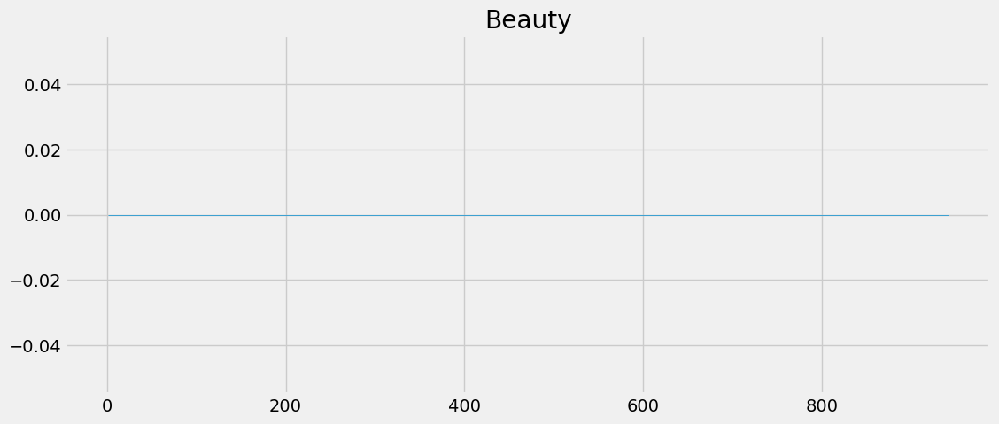

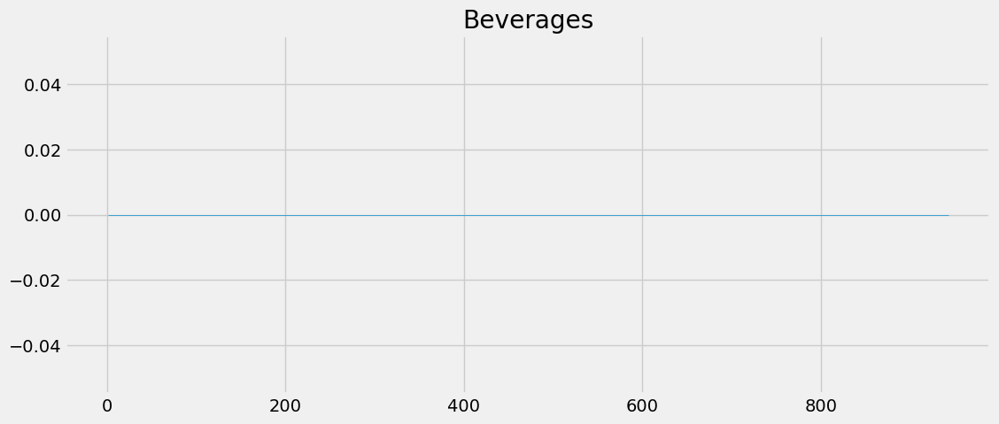

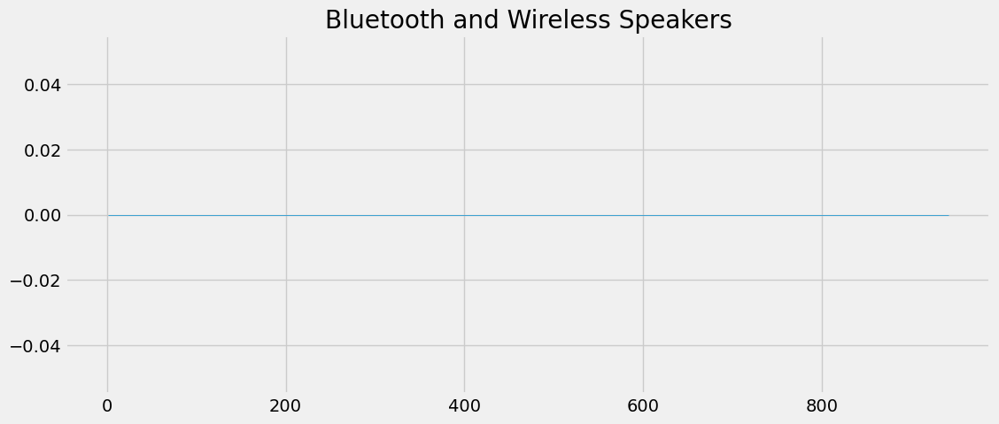

...

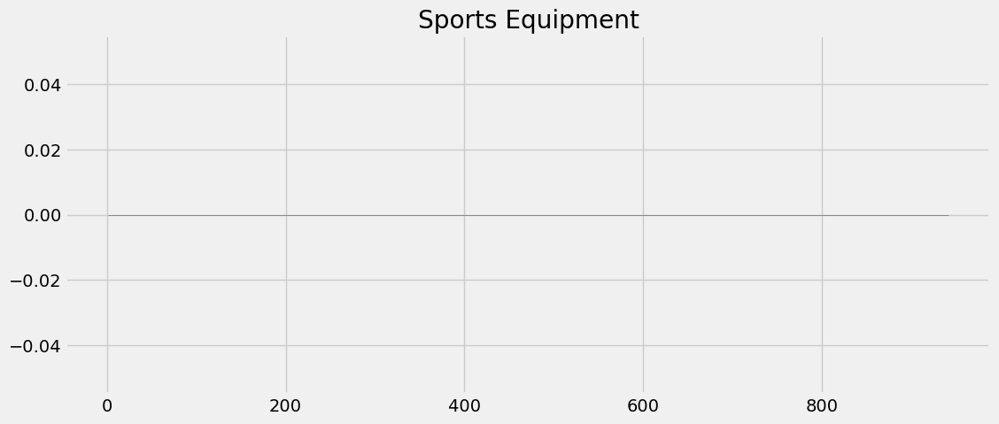

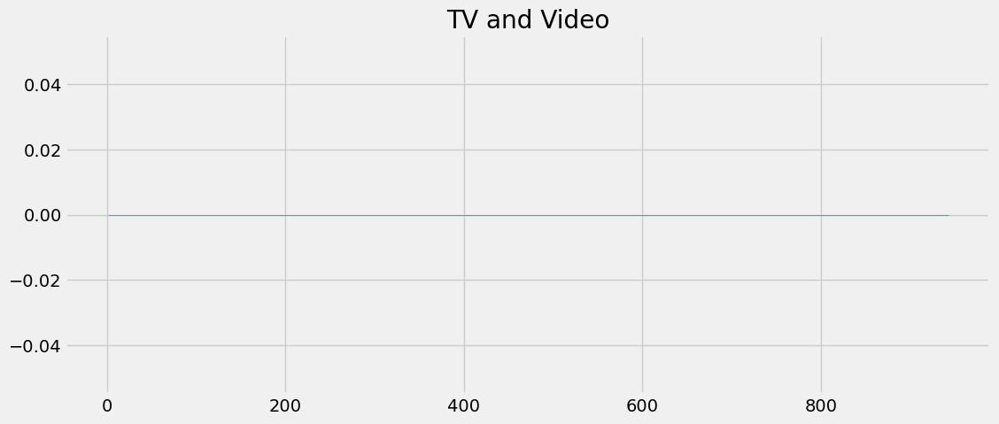

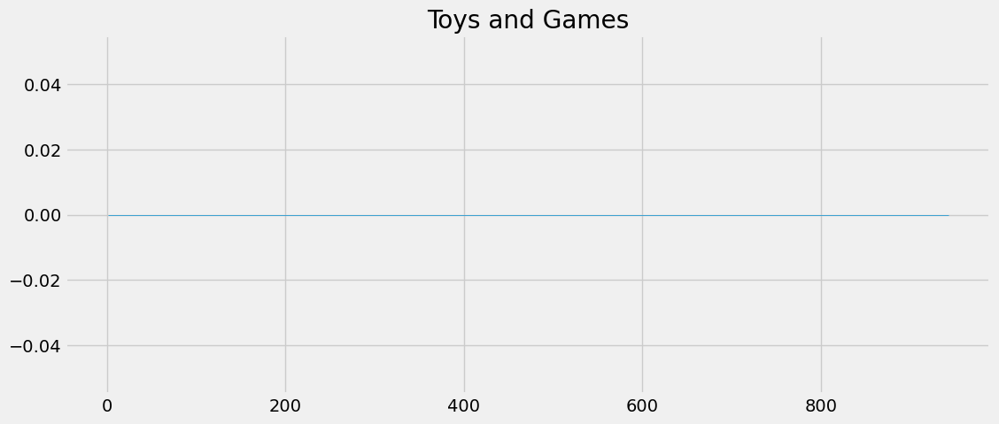

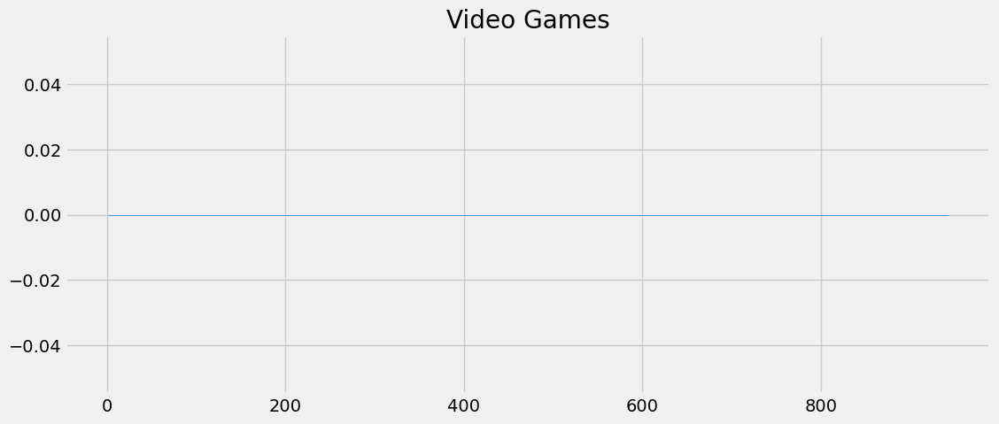

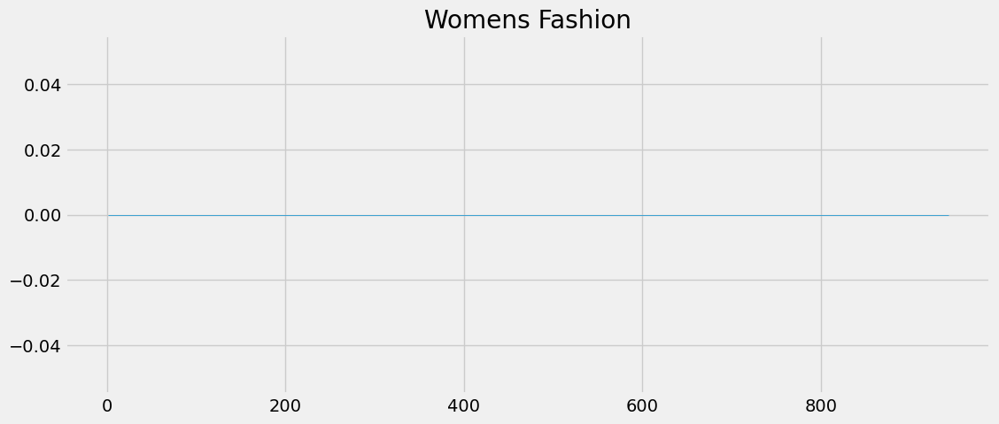

In [15]:
for df in df_list_imputed:
    timestamp_gaps = pd.Series(df.index).diff().dt.days - 1
    timestamp_gaps.plot(figsize=(12,5), grid=True, linewidth=0.5, title=df['Department'][0])
    plt.show()

We are satisfied that there are no more missing timestamps in our dataset. 

## 2.3.- Starting and ending dates after timestamp imputation

Let's inspect starting and ending dates again.

In [16]:
start_dates = []
end_dates = []
for df in df_list_imputed:
    print(f'Series for {df["Department"][0]}')
    print(f'Starting date: {df.index.min()} ; Ending date: {df.index.max()}')
    print(f'Number of rows in the series: {len(df)}')
    print('')

Series for Athletic Clothing
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 944

Series for Bathing Suits
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-30 00:00:00
Number of rows in the series: 943

Series for Beauty
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-30 00:00:00
Number of rows in the series: 943

Series for Beverages
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 944

Series for Bluetooth and Wireless Speakers
Starting date: 2012-04-02 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 943

Series for Camera, Photo, and Video
Starting date: 2012-04-01 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 944

Series for Cell Phones and Accessories
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-31 00:00:00
Number of rows in the series: 942

Series for Childrens Fashion
Starting date: 2012-04-01

After timestamp imputatation we observe that starting dates range between 1st and 3rd April 2012, whilst ending dates range between 29th and 31st October 2014. 

## 2.4.- Series plots after timestamp imputation

Let's plot the series to have an idea of the number of missing values after timestamp imputation:

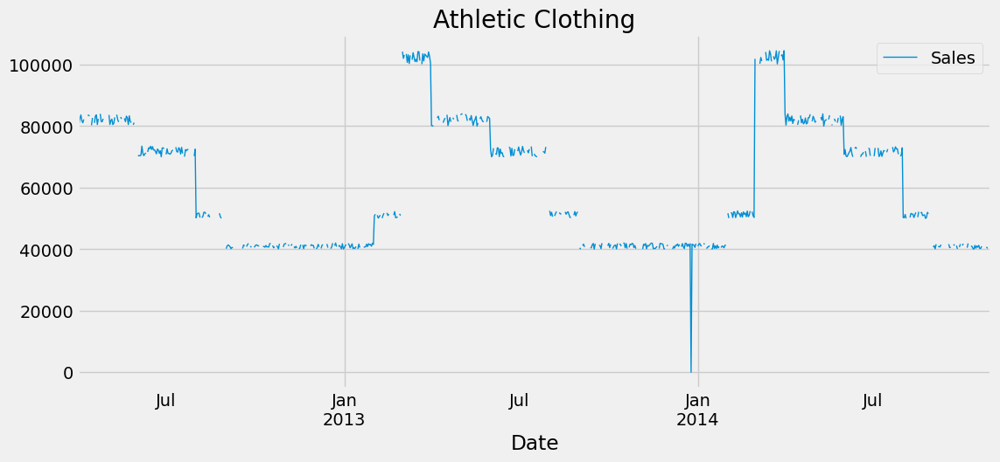

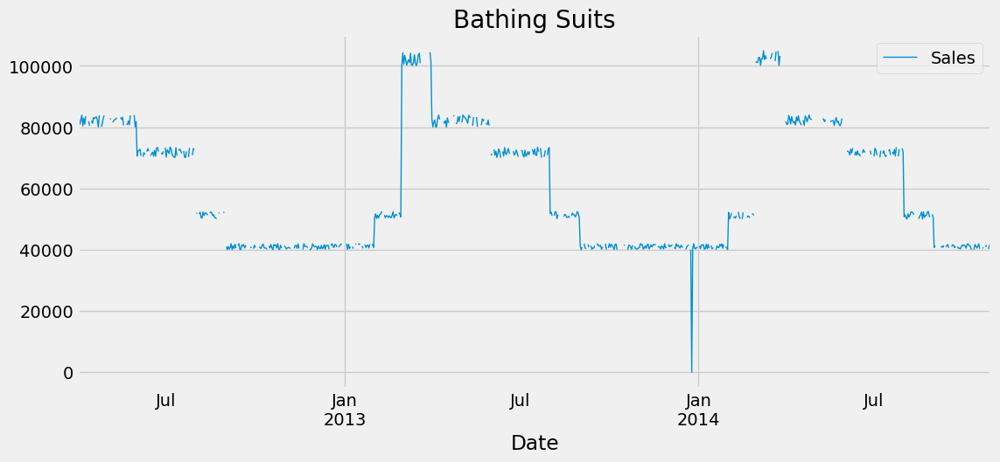

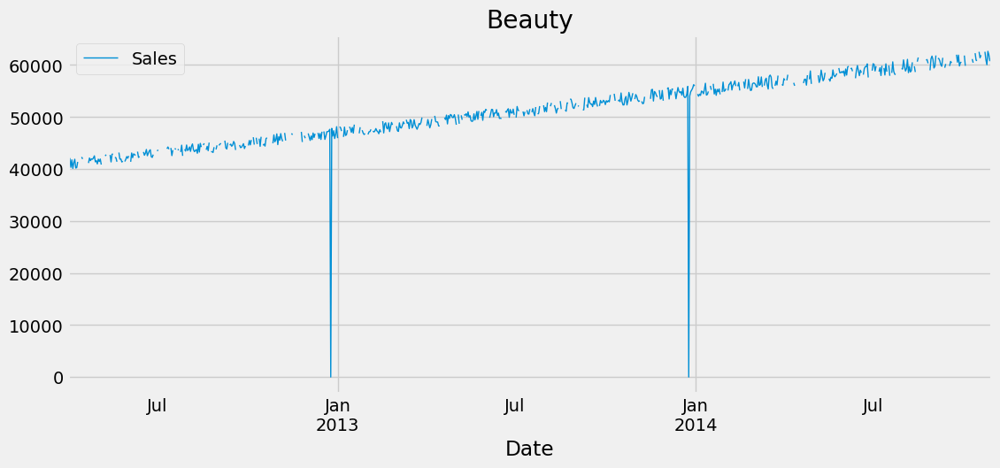

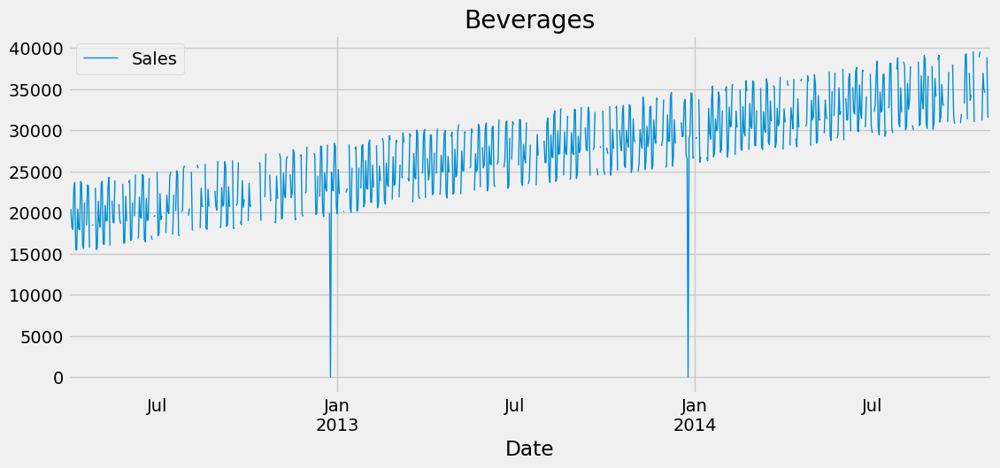

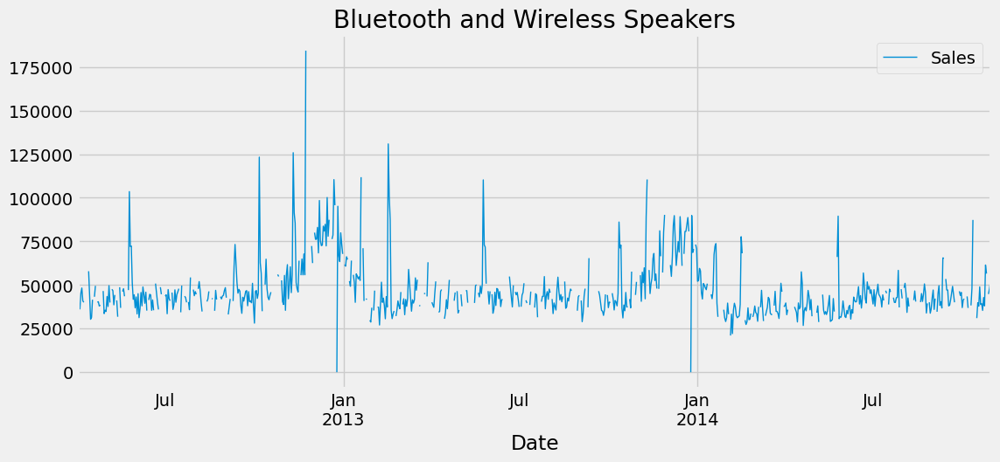

...

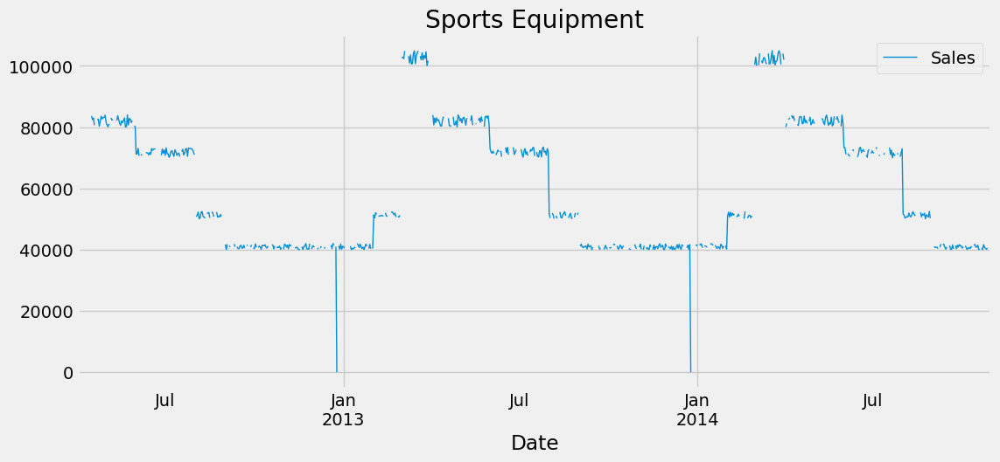

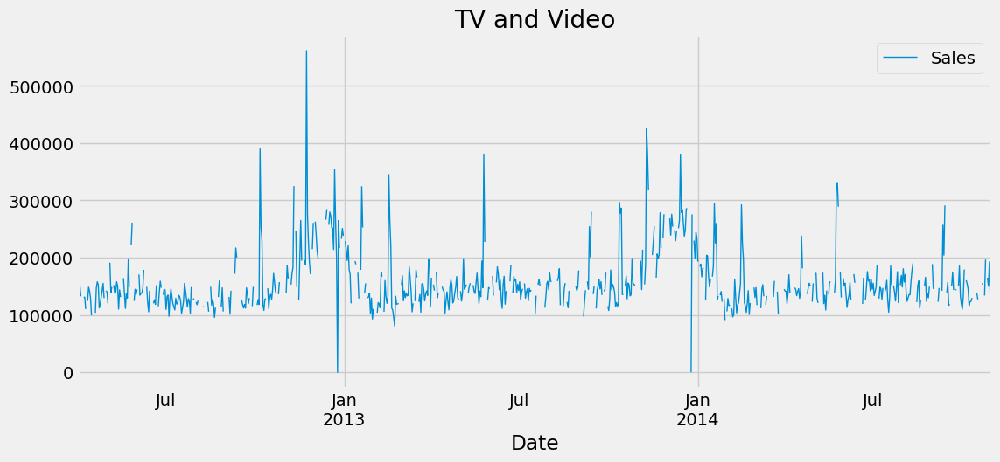

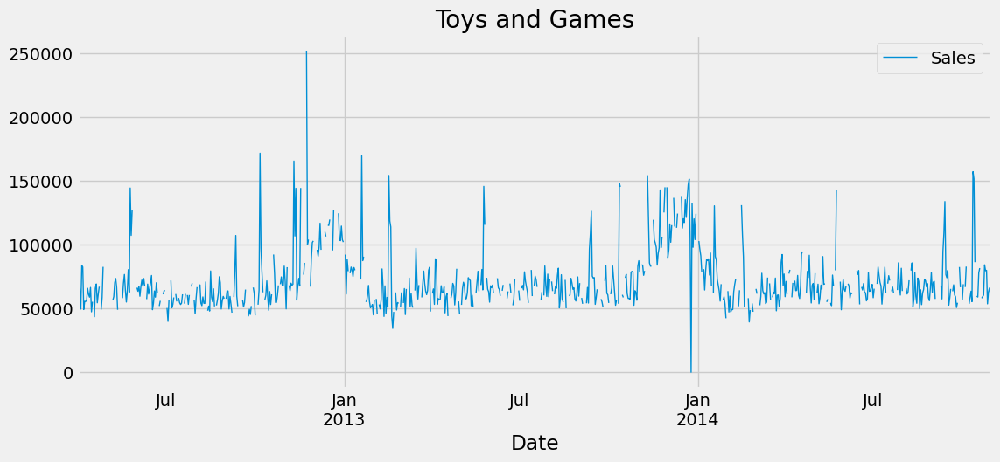

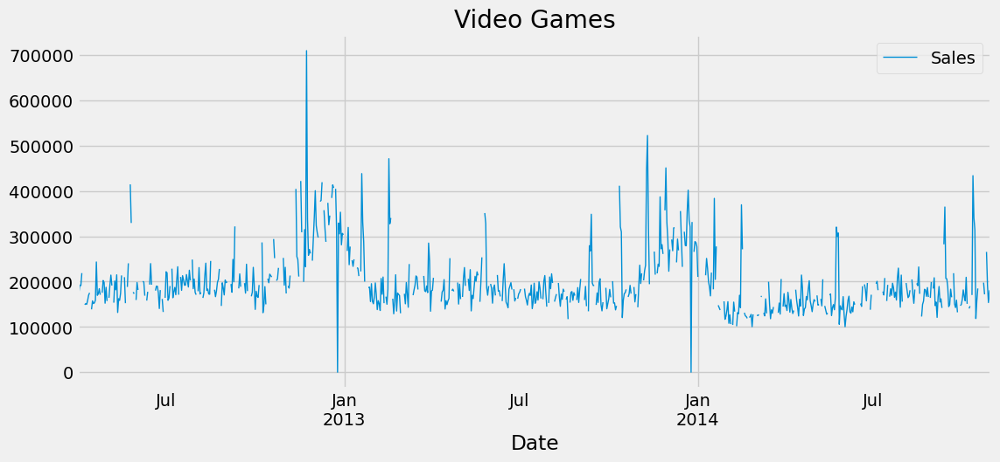

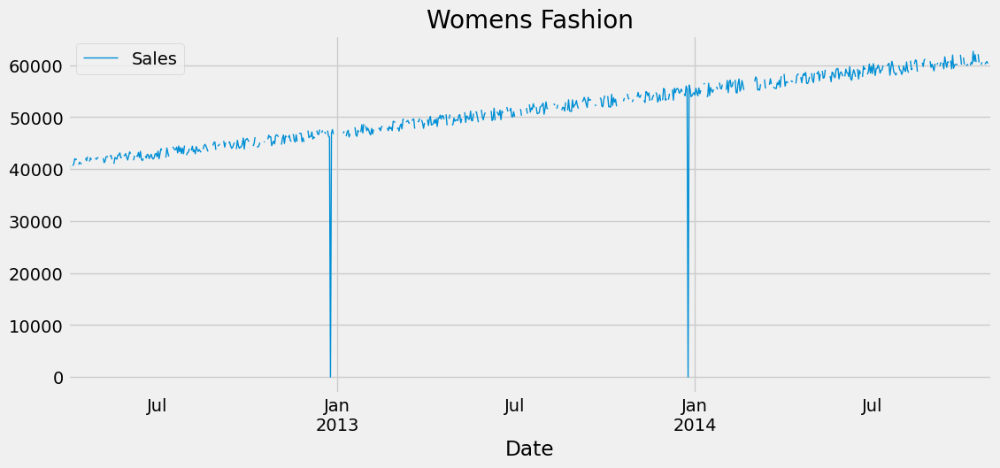

In [17]:
for df in df_list_imputed:
    df.plot(y='Sales', use_index=True, figsize=(12,5), grid=True, linewidth=1, title=df['Department'][0])

We can see that there are quite a few missing values in the `Sales` series after the timestamp imputation step.

# 3. Missing values imputation

In this section we will impute missing values in the dataset.

In [18]:
for df in df_list_imputed:
    print(f'Series for {df["Department"][0]}')
    print(df.isnull().sum())
    print('')

Series for Athletic Clothing
Department          218
Sales               218
Department_Size     218
Num_Employees       218
Returns_Pct         218
Num_Customers       218
Pct_On_Sale         219
Marketing           218
DestinationEvent    218
Pct_Promotional     218
Econ_ChangeGDP      934
EconJobsChange      838
AnnualizedCPI       917
dtype: int64

Series for Bathing Suits
Department          185
Sales               185
Department_Size     185
Num_Employees       185
Returns_Pct         185
Num_Customers       185
Pct_On_Sale         186
Marketing           185
DestinationEvent    185
Pct_Promotional     185
Econ_ChangeGDP      934
EconJobsChange      826
AnnualizedCPI       918
dtype: int64

Series for Beauty
Department          203
Sales               203
Department_Size     203
Num_Employees       203
Returns_Pct         203
Num_Customers       203
Pct_On_Sale         203
Marketing           203
DestinationEvent    203
Pct_Promotional     203
Econ_ChangeGDP      937
EconJobsChan

From the above counts we observe that:

* the count of missing values for the macroeconomic indicators (`Econ_ChangeGDP`, `EconJobsChange`, `AnnualizedCPI`) is almost the same across all series
* the count of missing values for all other features is almost the same within each department - this points at most of these missing values being generated by the missing timestamps imputation

## 3.1.- Imputation of categorical values

In [19]:
categorical_columns_selector = selector(dtype_include=object)
categorical_columns = categorical_columns_selector(df_1)
categorical_columns

['Department', 'Marketing', 'DestinationEvent']

We will impute categorical features by using the most frequent value in each feature.

In [20]:
for df in df_list_imputed:
    df[categorical_columns] = df[categorical_columns].apply(lambda x: x.fillna(x.value_counts().index[0]))

## 3.1.- Imputation of numerical values

### 3.1.1.- Imputation of macroeconomic indicators

We will begin by imputing missing values for the macroeconomic indicators in the dataset. We will achieve this by using forward imputation followed by backward imputation.

In [21]:
macroeconomic_indicators = ['Econ_ChangeGDP', 'EconJobsChange', 'AnnualizedCPI']

In [22]:
for df in df_list_imputed:
    df[macroeconomic_indicators] = df[macroeconomic_indicators].ffill().bfill()

### 3.1.2.- Imputation of other numerical features

In [23]:
numerical_columns_selector = selector(dtype_exclude=object)
numerical_columns = numerical_columns_selector(df_1)
numerical_columns = list(set(numerical_columns) - set(macroeconomic_indicators))
numerical_columns

['Returns_Pct',
 'Num_Customers',
 'Sales',
 'Department_Size',
 'Pct_Promotional',
 'Num_Employees',
 'Pct_On_Sale']

The numerical features in our dataset will be imputed by taking advantage of the interpolation methods available in Pandas; specifically, we will use the `time` method.

In [24]:
for df in df_list_imputed:
    df[numerical_columns] = df[numerical_columns].interpolate(method='time')

## 3.2.- Missing values imputation verification

In [25]:
for df in df_list_imputed:
    print(f'Series for {df["Department"][0]}')
    print(df.isnull().sum())
    print('')

Series for Athletic Clothing
Department          0
Sales               0
Department_Size     0
Num_Employees       0
Returns_Pct         0
Num_Customers       0
Pct_On_Sale         0
Marketing           0
DestinationEvent    0
Pct_Promotional     0
Econ_ChangeGDP      0
EconJobsChange      0
AnnualizedCPI       0
dtype: int64

Series for Bathing Suits
Department          0
Sales               0
Department_Size     0
Num_Employees       0
Returns_Pct         0
Num_Customers       0
Pct_On_Sale         0
Marketing           0
DestinationEvent    0
Pct_Promotional     0
Econ_ChangeGDP      0
EconJobsChange      0
AnnualizedCPI       0
dtype: int64

Series for Beauty
Department          0
Sales               0
Department_Size     0
Num_Employees       0
Returns_Pct         0
Num_Customers       0
Pct_On_Sale         0
Marketing           0
DestinationEvent    0
Pct_Promotional     0
Econ_ChangeGDP      0
EconJobsChange      0
AnnualizedCPI       0
dtype: int64

Series for Beverages
Departm

## 3.4.- Plot imputed series

Let's inspect the imputed `Sales` series.

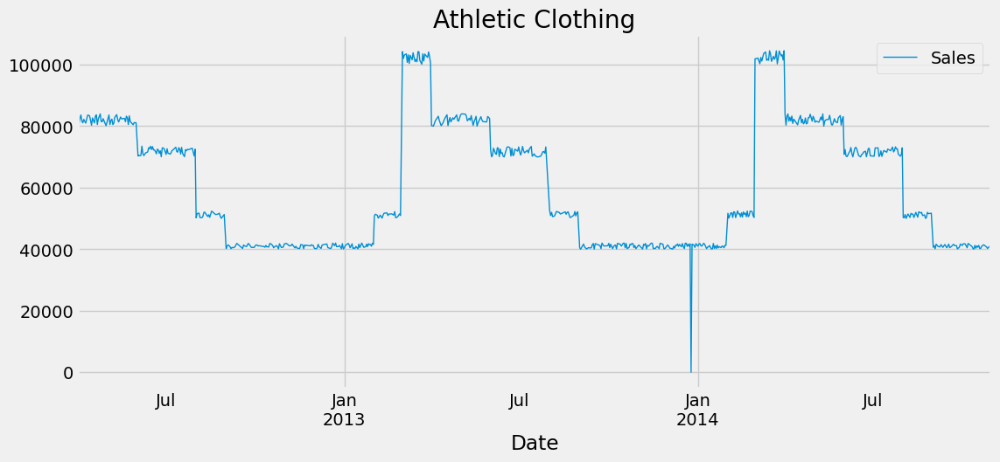

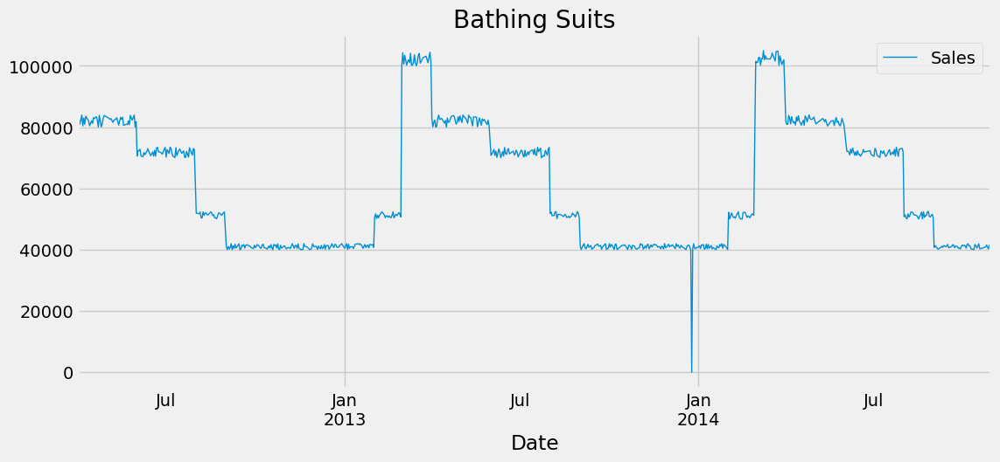

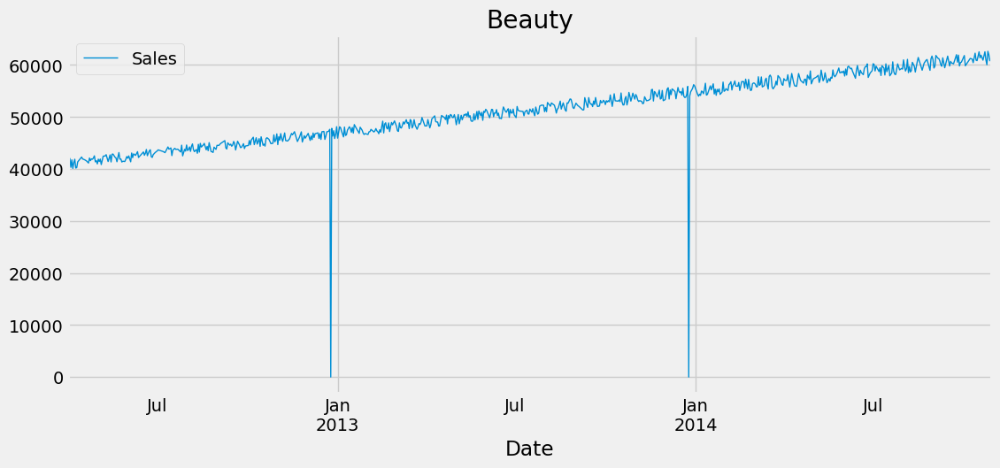

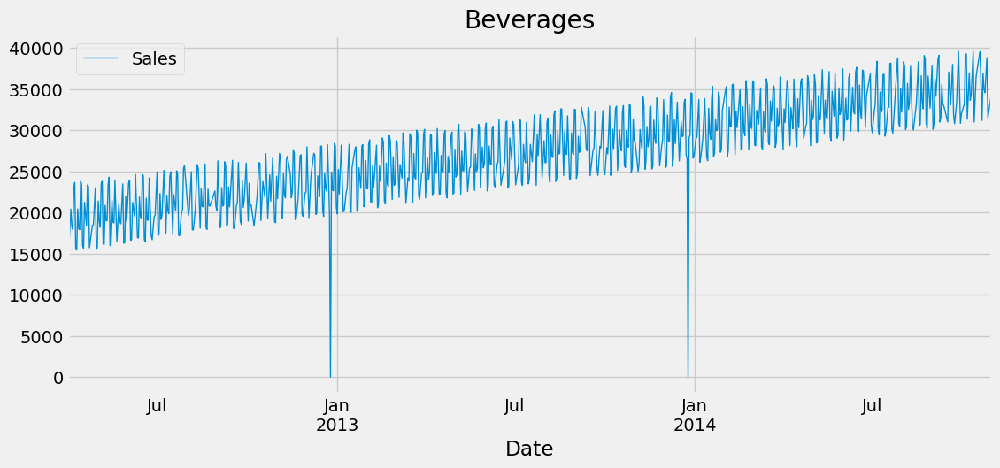

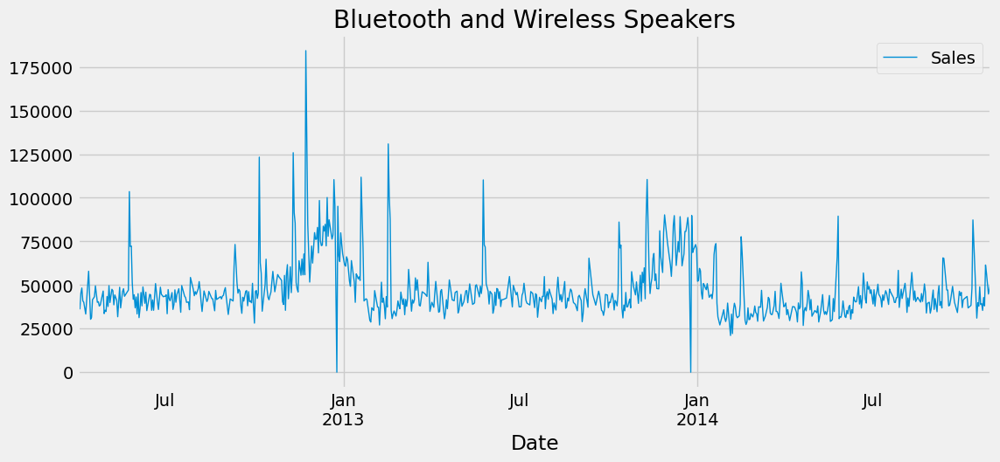

...

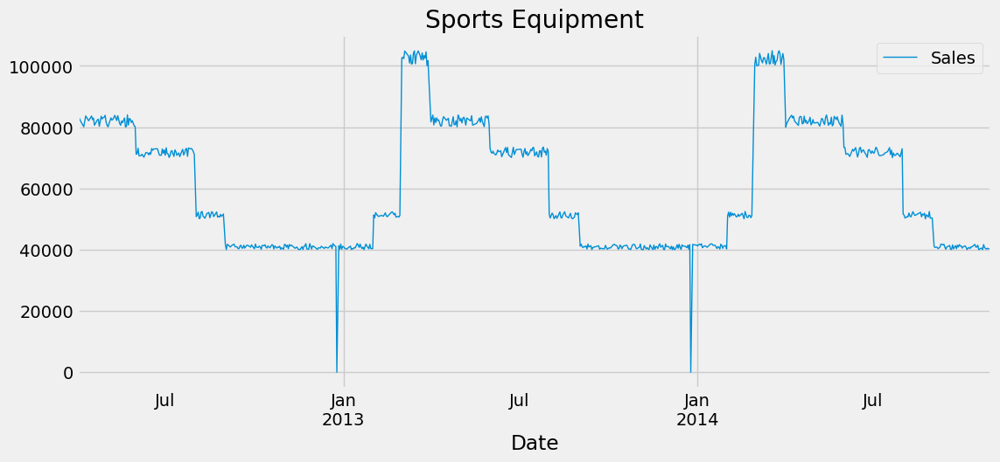

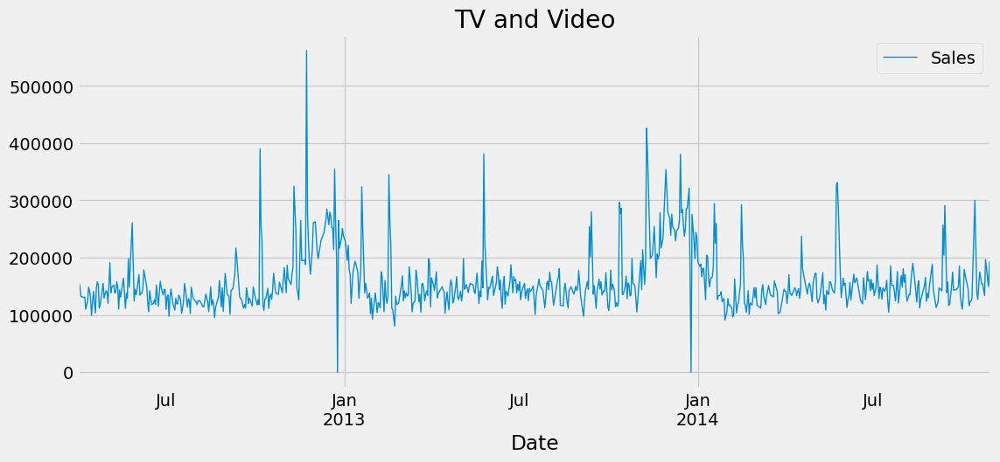

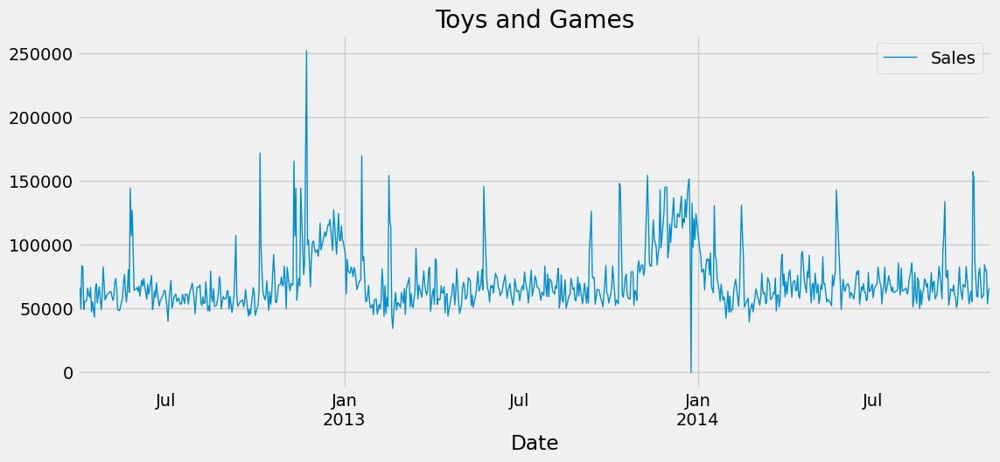

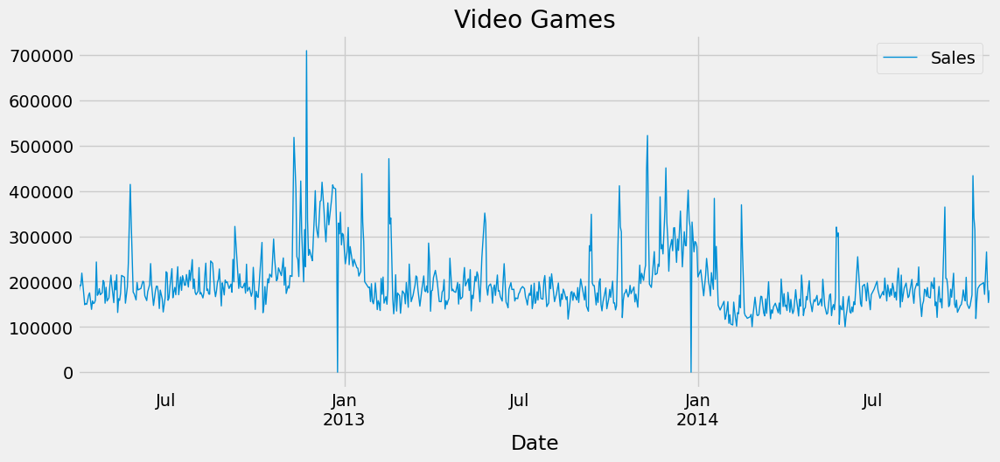

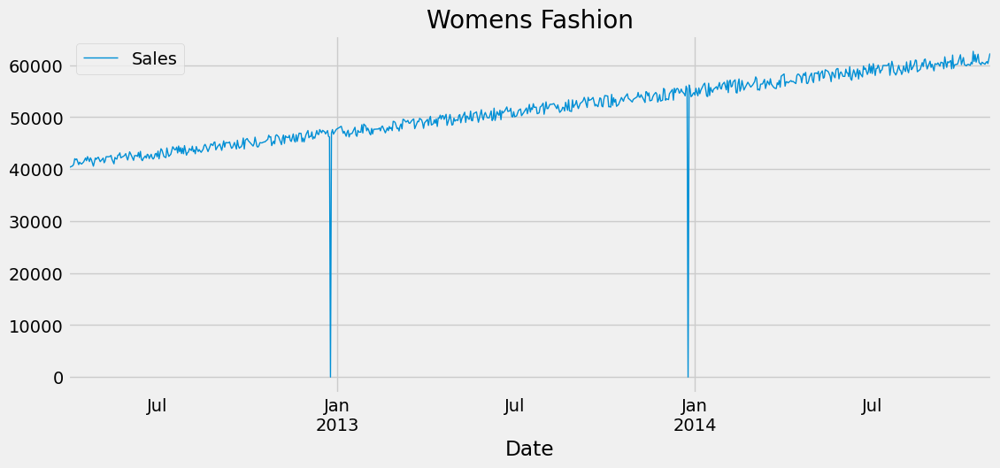

In [26]:
for df in df_list_imputed:
    df.plot(y='Sales', use_index=True, figsize=(12,5), grid=True, linewidth=1, title=df['Department'][0])

# 4.- Adjustment of series lenght

We are aware that the series in the dataset have different starting and ending dates. We will drop a few rows so that all the series will have the same lenght.

In [27]:
df_list_adjusted = []
for df in df_list_imputed:
    df = df[df.index >= '2012-04-03']
    df = df[df.index <= '2014-10-29']
    df_list_adjusted.append(df)

In [28]:
start_dates = []
end_dates = []
for df in df_list_adjusted:
    print(f'Series for {df["Department"][0]}')
    print(f'Starting date: {df.index.min()} ; Ending date: {df.index.max()}')
    print(f'Number of rows in the series: {len(df)}')
    print('')

Series for Athletic Clothing
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Bathing Suits
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Beauty
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Beverages
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Bluetooth and Wireless Speakers
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Camera, Photo, and Video
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Cell Phones and Accessories
Starting date: 2012-04-03 00:00:00 ; Ending date: 2014-10-29 00:00:00
Number of rows in the series: 940

Series for Childrens Fashion
Starting date: 2012-04-03

# 5.- Save prepared dataset

In [29]:
df_2 = pd.concat(df_list_adjusted)

In [30]:
df_2.reset_index(inplace=True)

In [31]:
df_2.head()

,Date,Department,Sales,Department_Size,Num_Employees,Returns_Pct,Num_Customers,Pct_On_Sale,Marketing,DestinationEvent,Pct_Promotional,Econ_ChangeGDP,EconJobsChange,AnnualizedCPI
0,2012-04-03,Athletic Clothing,82474.0,2060.0,65.0,0.444975,386.0,6.180215,In Store Credit Card Signup Discount; Spring P...,No,0.029847,0.780263,4300.0,-0.025092
1,2012-04-04,Athletic Clothing,83639.0,2060.0,67.0,0.836780,364.0,7.149818,In Store Credit Card Signup Discount; Spring P...,No,0.028064,0.780263,4300.0,-0.025092
2,2012-04-05,Athletic Clothing,81763.0,2060.0,65.0,0.991318,567.0,10.323724,In Store Credit Card Signup Discount; Spring P...,No,0.030224,0.780263,4300.0,-0.025092
3,2012-04-06,Athletic Clothing,81082.0,2060.0,65.0,0.605925,709.0,8.392068,In Store Credit Card Signup Discount; Spring P...,No,0.030482,0.780263,4300.0,-0.025092
4,2012-04-07,Athletic Clothing,82190.0,2060.0,68.0,0.342021,491.0,9.113846,In Store Credit Card Signup Discount; Spring P...,No,0.038417,0.780263,4300.0,-0.025092


In [32]:
df_2.to_csv('data/time_series_poc_certification_training_prepared.csv', index=False)

In [33]:
# end